<a href="https://colab.research.google.com/github/poojan007/ICT606-Tutorials/blob/main/ICT606_Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BERTopic on Twitter Climate Change Dataset

This notebook demonstrates the step-by-step process of performing BERTopic for topic modeling. The main tasks include data preprocessing, topic modeling, and visualization of the results.

## Upload file by mounting google drive

In [161]:
from google.colab import drive
drive.mount('/mntDrive')

Drive already mounted at /mntDrive; to attempt to forcibly remount, call drive.mount("/mntDrive", force_remount=True).


In [162]:
!cp -rf /mntDrive/MyDrive/ICT606-Dataset/twitter_sentiment_data.csv -d twitter_sentiment_data.csv

Installing BERTopic package

In [163]:
%%capture
!pip install bertopic

## Data preparation

First, we need to import the necessary libraries and load the dataset into a pandas DataFrame. Then, we will inspect and clean the data, including converting text to lowercase.

In [164]:
import pandas as pd
import numpy as np
from bertopic import BERTopic

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
import nltk
import re

import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns

# Download necessary NLTK data files
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# Load your dataset
df = pd.read_csv('twitter_sentiment_data.csv')
df.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,sentiment,message,tweetid
0,-1,@tiniebeany climate change is an interesting h...,792927353886371840
1,1,RT @NatGeoChannel: Watch #BeforeTheFlood right...,793124211518832641
2,1,Fabulous! Leonardo #DiCaprio's film on #climat...,793124402388832256
3,1,RT @Mick_Fanning: Just watched this amazing do...,793124635873275904
4,2,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",793125156185137153


## Exploratory Data Analysis (EDA)

General Statistics

The dataset has 43943 observations and 3 variables.

In [165]:
# General Statistics
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43943 entries, 0 to 43942
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  43943 non-null  int64 
 1   message    43943 non-null  object
 2   tweetid    43943 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.0+ MB
None


Word cloud to check the word occurence

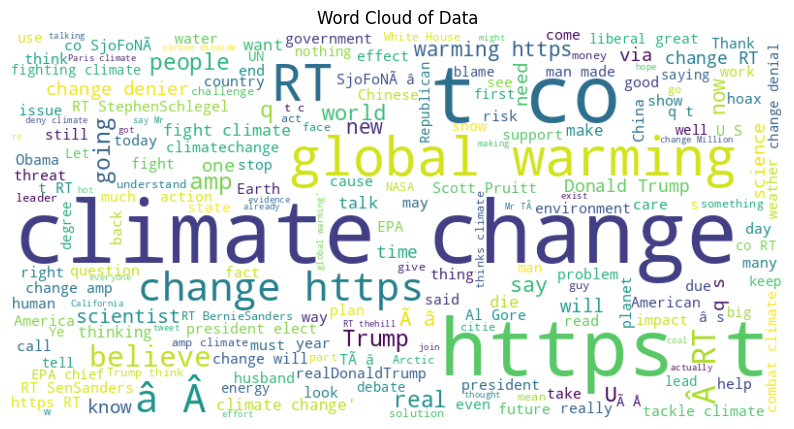

In [166]:
# Word Cloud
text = ' '.join(df['message'].tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Data')
plt.show()

## Data preprocessing

In this step, we preprocess the text by removing URLs, mentions, hashtags, special characters, and extra spaces. We also perform tokenization, and apply lemmatization.

In [167]:
# Identify inconsistencies
# It returns the total duplicate rows in the dataset
total_duplicates = df.duplicated().sum()
print("Total duplicate rows:", total_duplicates)

Total duplicate rows: 0


In [168]:
# Identify missing values
# The code is calculating the number of missing values in each column of the DataFrame `df`.
# It uses the `isna()` method to check for missing values and the `sum()` method to calculate the total number
# of missing values in each column. The result is stored in the variable `missing_values`.
missing_values = df.isna().sum()
missing_values

sentiment    0
message      0
tweetid      0
dtype: int64

In [169]:
# Define stop words
stop_words = set(stopwords.words('english'))

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Combined preprocessing function
def preprocess_text(text):
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    # Remove mentions
    text = re.sub(r'@\w+', '', text)
    # Remove hashtags
    text = re.sub(r'#\w+', '', text)
    # Remove special characters
    text = re.sub(r'[^A-Za-z\s]', '', text)
    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()

    # Tokenize text
    tokens = word_tokenize(text)
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    # Remove stop words
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]

    # Join tokens back into a single string
    return ' '.join(filtered_tokens)

# Apply the preprocessing function to the DataFrame
df['cleaned_text'] = df['message'].apply(preprocess_text)

df.head()

,sentiment,message,tweetid,cleaned_text
0,-1,@tiniebeany climate change is an interesting h...,792927353886371840,climate change interesting hustle wa global wa...
1,1,RT @NatGeoChannel: Watch #BeforeTheFlood right...,793124211518832641,RT Watch right travel world tackle climate cha...
2,1,Fabulous! Leonardo #DiCaprio's film on #climat...,793124402388832256,Fabulous Leonardo film change brilliant watch via
3,1,RT @Mick_Fanning: Just watched this amazing do...,793124635873275904,RT watched amazing documentary leonardodicapri...
4,2,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",793125156185137153,RT Pranita Biswasi Lutheran Odisha give testim...


## Model Training

In [170]:
topic_model = BERTopic(language = "english")
topics, probabilities = topic_model.fit_transform(df['cleaned_text'])

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



In [171]:
# check the topic length
len(set(topics))

696

In [172]:
# # check the most frequent topics
freq = topic_model.get_topic_info(); freq.head(5)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,14406,-1_warming_global_like_know,"[warming, global, like, know, get, cold, scien...",[people saying dont look sun people say climat...
1,0,541,0_amp_energy_clean_working,"[amp, energy, clean, working, together, tonigh...",[amp look increase energy access amp address c...
2,1,515,1_shes_husband_thinking_die,"[shes, husband, thinking, die, going, doesnt, ...",[RT shes thinking shes going die husband doesn...
3,2,328,2_voice_talk_conversation_speech,"[voice, talk, conversation, speech, talking, s...","[RT used speech talk climate change, RT matter..."
4,3,308,3_website_page_remove_removed,"[website, page, remove, removed, epa, removing...","[EPA remove climate change page website, EPA r..."


In [173]:
# Check the topic frequencies for all the topics
topic_model.get_topic_freq()

,Topic,Count
0,-1,14406
31,0,541
451,1,515
22,2,328
410,3,308
...,...,...
261,690,10
168,691,10
527,692,10
307,693,10


## Reducing the outliers

Calculate the c-TF-IDF representation for each outlier document and find the best matching c-TF-IDF topic representation using cosine similarity.

In [174]:
# Reduce outliers using the `c-tf-idf` strategy
#new_topics = topic_model.reduce_outliers(df['cleaned_text'], topics, strategy="c-tf-idf")

## Update Topic Representation

In [175]:
#topic_model.update_topics(df['cleaned_text'], topics=new_topics)

In [176]:
# Check the topic frequencies for all the topics after removing the outliers
#topic_model.get_topic_freq()

In [177]:
# # check the most frequent topics
#freq = topic_model.get_topic_info(); freq.head(5)

## Visualisations

In [178]:
# Visualize topics
topic_model.visualize_topics()

In [179]:
# Visualise the topic hierarchies
topic_model.visualize_hierarchy(top_n_topics=50)

In [180]:
# Visualise the top 5 topics
topic_model.visualize_barchart(top_n_topics=5)

In [181]:
# Visualise the topic similarity matrix
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [182]:
# Visualise the topic decline score
topic_model.visualize_term_rank()

## Model Evaluation



In [183]:
# import library from gensim
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel

# Preprocess documents
cleaned_docs = topic_model._preprocess_text(df["cleaned_text"])

# Extract vectorizer from BERTopic
vectorizer = topic_model.vectorizer_model

# Extract features for Topic Coherence evaluation
analyzer = vectorizer.build_analyzer()
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]
topics = topic_model.get_topics()
topics.pop(-1, None)
topic_words = [
[word for word, _ in topic_model.get_topic(topic) if word != ""] for topic in topics
]
topic_words = [[words for words, _ in topic_model.get_topic(topic)]
        for topic in range(len(set(topics))-1)][:10]

# Evaluate
coherence_model = CoherenceModel(topics=topic_words,
                          texts=tokens,
                          corpus=corpus,
                          dictionary=dictionary,
                          coherence='c_v')
coherence = coherence_model.get_coherence()

In [184]:
print(coherence)

0.4571472009644588


In [185]:
coherence_per_topic = coherence_model.get_coherence_per_topic()
coherence_per_topic[:10]

[0.3238602060553607,
 0.7740472151450911,
 0.3977512350066236,
 0.704949357918386,
 0.48744861816595775,
 0.2937276857695681,
 0.2725862807394342,
 0.59380835132753,
 0.32273386426324563,
 0.400559195253391]

In [186]:
# Representative Examples
topic_docs = topic_model.get_representative_docs()
print(topic_docs)

{-1: ['people saying dont look sun people say climate change real know thats lie', 'RT yall voted man think global warming wa created CHINA thats even worse thing stand', 'Someone arguing work climate change like even president doesnt believe real still gon na job'], 0: ['amp look increase energy access amp address climate change', 'KNOW amp say climate change isnt real', 'RT amp climate change'], 1: ['RT shes thinking shes going die husband doesnt believe climate change', 'RT shes thinking shes going die husband doesnt believe climate change', 'RT shes thinking shes going die husband doesnt believe climate change'], 2: ['RT used speech talk climate change', 'RT matter give voice climate change denier', 'Talk climate change'], 3: ['EPA remove climate change page website', 'EPA remove climate change page website', 'RT white house site removed climate change LGBT page removing website doesnt remove real'], 4: ['impact climate change directly affect availability quality access natural res